# Eager Few Shot Object Detection on Colab

Demo for training the object recognizer on the colab environment.

## Imports

In [21]:
!pip install -U --pre tensorflow=="2.2.0"

Requirement already up-to-date: tensorflow==2.2.0 in /usr/local/lib/python3.6/dist-packages (2.2.0)


In [ ]:
!rm -rf DeepDeepBarrelKicker

In [22]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

# Clone the DeepDeep repository if it doesn't already exist
if not pathlib.Path('DeepDeepBarrelKicker').exists():
  !git clone --depth 1 https://github.com/robobenklein/DeepDeepBarrelKicker

In [23]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1548814 sha256=3ef2fef346e5c989b1b44f6e307d775347ebb8c6c6f3b50bb658b63f6c8f3bc7
  Stored in directory: /tmp/pip-ephem-wheel-cache-rolsfojd/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
Successfully built object-detection
  Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [24]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

# Utilities

In [25]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)


# Barrel Image Training data

Here's our first attempt at a training set of images for recognizing the barrels. It's a pretty poorly diverse set, so we need to replace it and add better variety in the set.

In [26]:
ls -lah 'DeepDeepBarrelKicker/trainingsets/'

total 20K
drwxr-xr-x 5 root root 4.0K Aug 10 23:52 ./
drwxr-xr-x 6 root root 4.0K Aug 10 23:52 ../
-rw-r--r-- 1 root root    0 Aug 10 23:52 .gitattributes
drwxr-xr-x 2 root root 4.0K Aug 10 23:52 max1/
drwxr-xr-x 2 root root 4.0K Aug 10 23:52 max2/
drwxr-xr-x 2 root root 4.0K Aug 10 23:52 robo1-hoops/


barrels loading...
hoops loading...


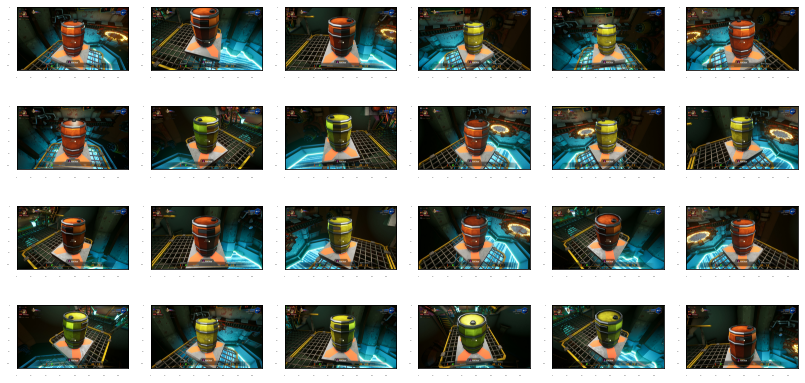

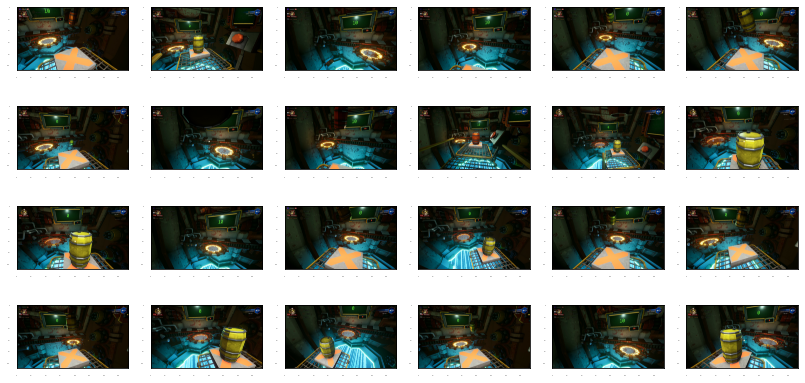

In [29]:
# Load images and visualize
train_image_dir_barrel = 'DeepDeepBarrelKicker/trainingsets/max1/'
train_image_dir_hoop = 'DeepDeepBarrelKicker/trainingsets/robo1-hoops/'

train_images_np_barrel = []
train_images_np_hoop = []

print("barrels loading...")
for f in os.listdir(train_image_dir_barrel):
  # print(f"Loading image {f}")
  image_path = os.path.join(train_image_dir_barrel, f)
  train_images_np_barrel.append(load_image_into_numpy_array(image_path))

print("hoops loading...")
for f in os.listdir(train_image_dir_hoop):
  # print(f"Loading image {f}")
  image_path = os.path.join(train_image_dir_hoop, f)
  train_images_np_hoop.append(load_image_into_numpy_array(image_path))

plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14, 7]

print("showing barrels")
for idx, train_image_np in enumerate(train_images_np_barrel):
  if idx >= 4*6:
    break
  plt.subplot(4, 6, idx+1)
  plt.imshow(train_image_np)
plt.show()

print("showing hoops")
for idx, train_image_np in enumerate(train_images_np_hoop):
  if idx >= 4*6:
    break
  plt.subplot(4, 6, idx+1)
  plt.imshow(train_image_np)
plt.show()

# Annotate images with bounding boxes

In this cell you will annotate the barrels --- draw a box around the barrel in each image; click `next image` to go to the next image and `submit` when there are no more images left to annotate.

If you'd like to skip the manual annotation step, we totally understand.  In the next cell there may be a preset variable based on this set of training images, simply run that one instead to populate the values.



In [52]:
gt_boxes_barrel = []
colab_utils.annotate(train_images_np_barrel, box_storage_pointer=gt_boxes_barrel)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'--boxes array populated--'

<IPython.core.display.Javascript object>

In [40]:
gt_boxes_hoop = []
colab_utils.annotate(train_images_np_hoop, box_storage_pointer=gt_boxes_hoop)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

'--boxes array populated--'

<IPython.core.display.Javascript object>

# In case you didn't want to label...

Run this cell only if you didn't annotate anything above and
would prefer to just use our preannotated boxes.  Don't forget
to uncomment.

In [53]:
# gt_boxes = [
#             np.array([[0.436, 0.591, 0.629, 0.712]], dtype=np.float32),
#             np.array([[0.539, 0.583, 0.73, 0.71]], dtype=np.float32),
#             np.array([[0.464, 0.414, 0.626, 0.548]], dtype=np.float32),
#             np.array([[0.313, 0.308, 0.648, 0.526]], dtype=np.float32),
#             np.array([[0.256, 0.444, 0.484, 0.629]], dtype=np.float32)
# ]
print(f"barrels: {len(gt_boxes_barrel)} {gt_boxes_barrel}")
np.save('gt_boxes_barrel', gt_boxes_barrel)
print(f"hoops: {len(gt_boxes_hoop)} {gt_boxes_hoop}")
np.save('gt_boxes_hoop', gt_boxes_hoop)

barrels: 28 [array([[0.19833333, 0.38645833, 0.79666667, 0.60625   ]]), array([[0.005     , 0.34583333, 0.64666667, 0.6109375 ]]), array([[0.14166667, 0.38020833, 0.79666667, 0.6328125 ]]), array([[0.22833333, 0.4       , 0.76166667, 0.58958333]]), array([[0.25333333, 0.39427083, 0.77166667, 0.57916667]]), array([[0.18833333, 0.37708333, 0.82833333, 0.61927083]]), array([[0.205     , 0.3875    , 0.83166667, 0.621875  ]]), array([[0.14      , 0.37135417, 0.76833333, 0.60885417]]), array([[0.11      , 0.36197917, 0.73      , 0.60104167]]), array([[0.195     , 0.40677083, 0.80166667, 0.6421875 ]]), array([[0.20166667, 0.38177083, 0.76333333, 0.58854167]]), array([[0.15166667, 0.39114583, 0.735     , 0.60260417]]), array([[0.16833333, 0.3875    , 0.77666667, 0.6171875 ]]), array([[0.14333333, 0.36145833, 0.815     , 0.625     ]]), array([[0.155     , 0.37447917, 0.76666667, 0.60364583]]), array([[0.135     , 0.38229167, 0.74      , 0.625     ]]), array([[0.10833333, 0.37864583, 0.72      ,

# Prepare data for training

Below we add the class annotations (for simplicity, we assume a single class in this colab; though it should be straightforward to extend this to handle multiple classes).  We also convert everything to the format that the training
loop below expects (e.g., everything converted to tensors, classes converted to one-shot representations, etc.).

In [54]:

# By convention, our non-background classes start counting at 1.  Given
# that we will be predicting just one class, we will therefore assign it a
# `class id` of 1.
hoop_class_id = 1
barrel_class_id = 2
num_classes = 2

category_index = {
  hoop_class_id: {'id': hoop_class_id, 'name': 'hoop'},
  barrel_class_id: {'id': hoop_class_id, 'name': 'barrel'},
}

# Convert class labels to one-hot; convert everything to tensors.
# The `label_id_offset` here shifts all classes by a certain number of indices;
# we do this here so that the model receives one-hot labels where non-background
# classes start counting at the zeroth index.  This is ordinarily just handled
# automatically in our training binaries, but we need to reproduce it here.
label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []

print("preparing hoops")
for (train_image_np, gt_box_np) in zip(train_images_np_hoop, gt_boxes_hoop):
  train_image_tensors.append(
    tf.expand_dims(
      tf.convert_to_tensor(
        train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(
    tf.convert_to_tensor(
        gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
      np.ones(
        shape=[gt_box_np.shape[0]], dtype=np.int32) + (hoop_class_id - label_id_offset) - 1)
  gt_classes_one_hot_tensors.append(
    tf.one_hot(
      zero_indexed_groundtruth_classes, num_classes))

print("preparing barrels")
for (train_image_np, gt_box_np) in zip(train_images_np_barrel, gt_boxes_barrel):
  train_image_tensors.append(
    tf.expand_dims(
      tf.convert_to_tensor(
        train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(
    tf.convert_to_tensor(
        gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
      np.ones(
        shape=[gt_box_np.shape[0]], dtype=np.int32) + (barrel_class_id - label_id_offset) - 1)
  gt_classes_one_hot_tensors.append(
    tf.one_hot(
      zero_indexed_groundtruth_classes, num_classes))

print('Done prepping data.')


preparing hoops
preparing barrels
Done prepping data.


# Let's just visualize the barrel outlines as a sanity check


hoops:


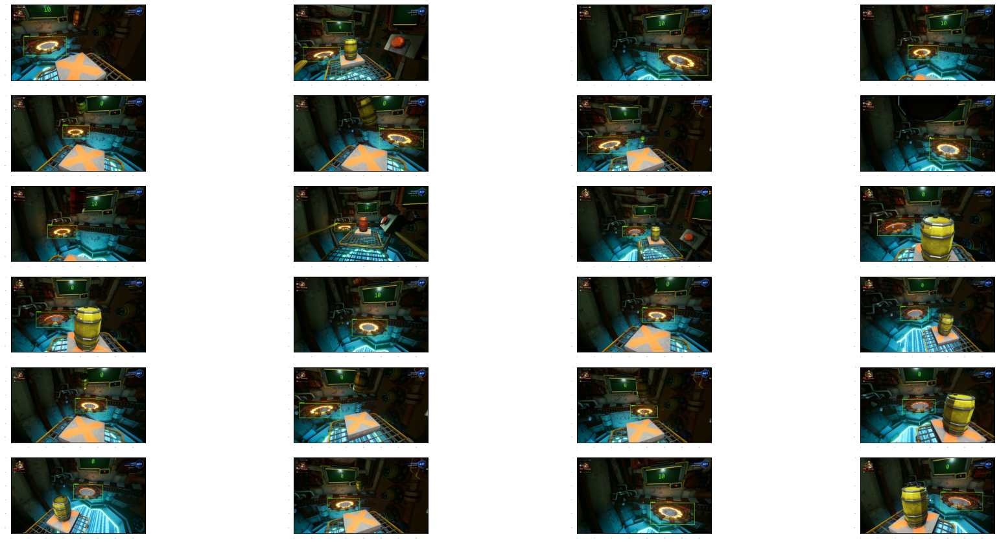

barrels:


<Figure size 1008x504 with 0 Axes>

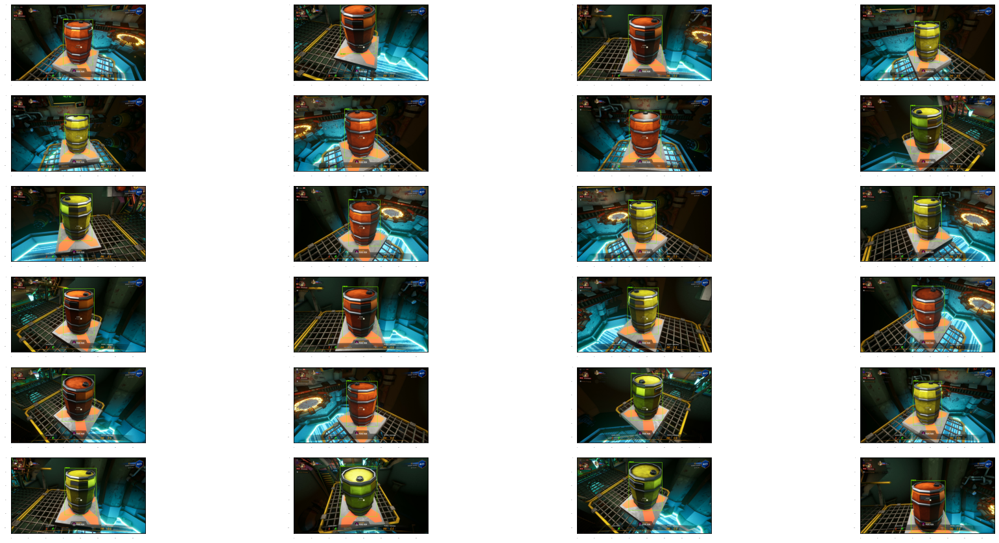

In [56]:
dummy_scores = np.array([1.0], dtype=np.float32)  # give boxes a score of 100%

plt.figure(figsize=(30, 15))

# for idx in range(24):
print("hoops:")
for idx, _ in enumerate(train_images_np_hoop):
  if idx >= 6*4:
    break
  plt.subplot(6, 4, idx+1)
  plot_detections(
      train_images_np_hoop[idx],
      gt_boxes_hoop[idx],
      np.ones(shape=[gt_boxes_hoop[idx].shape[0]], dtype=np.int32),
      dummy_scores, category_index)
plt.show()

plt.clf()
plt.figure(figsize=(30, 15))
# for idx in range(24):
print("barrels:")
for idx, _ in enumerate(train_images_np_barrel):
  if idx >= 6*4:
    break
  plt.subplot(6, 4, idx+1)
  plot_detections(
      train_images_np_barrel[idx],
      gt_boxes_barrel[idx],
      np.ones(shape=[gt_boxes_barrel[idx].shape[0]], dtype=np.int32),
      dummy_scores, category_index)
plt.show()

# Create model and restore weights for all but last layer

In this cell we build a single stage detection architecture (RetinaNet) and restore all but the classification layer at the top (which will be automatically randomly initialized).

For simplicity, we have hardcoded a number of things in this colab for the specific RetinaNet architecture at hand (including assuming that the image size will always be 640x640), however it is not difficult to generalize to other model configurations.

In [57]:
# Download the checkpoint and put it into models/research/object_detection/test_data/

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2020-08-11 01:44:40--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.99.128, 2607:f8b0:400e:c09::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.99.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M   310MB/s    in 0.8s    

2020-08-11 01:44:41 (310 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [244817203/244817203]



In [58]:
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)
num_classes = 1
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

# Load pipeline config and build a detection model.
#
# Since we are working off of a COCO architecture which predicts 90
# class slots by default, we override the `num_classes` field here to be just
# one (for our new rubber ducky class).
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

# Set up object-based checkpoint restore --- RetinaNet has two prediction
# `heads` --- one for classification, the other for box regression.  We will
# restore the box regression head but initialize the classification head
# from scratch (we show the omission below by commenting out the line that
# we would add if we wanted to restore both heads)
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

Building model and restoring weights for fine-tuning...
Weights restored!


# Eager mode custom training loop



In [60]:
tf.keras.backend.set_learning_phase(True)

# These parameters can be tuned; since our training set has 5 images
# it doesn't make sense to have a much larger batch size, though we could
# fit more examples in memory if we wanted to.
batch_size = 4
learning_rate = 0.01
num_batches = 100

# Select variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

# Set up forward + backward pass for a single train step.
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
  """Get a tf.function for training step."""

  # Use tf.function for a bit of speed.
  # Comment out the tf.function decorator if you want the inside of the
  # function to run eagerly.
  @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):
    """A single training iteration.

    Args:
      image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
        Note that the height and width can vary across images, as they are
        reshaped within this function to be 640x640.
      groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
        tf.float32 representing groundtruth boxes for each image in the batch.
      groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
        with type tf.float32 representing groundtruth boxes for each image in
        the batch.

    Returns:
      A scalar tensor representing the total loss for the input batch.
    """
    shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(
    detection_model, optimizer, to_fine_tune)

print('Start fine-tuning!', flush=True)
for idx in range(num_batches):
  # Grab keys for a random subset of examples
  all_keys = list(range(len(train_images_np_barrel) + len(train_images_np_hoop)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]

  # Note that we do not do data augmentation in this demo.  If you want a
  # a fun exercise, we recommend experimenting with random horizontal flipping
  # and random cropping :)
  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensors[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  if idx % 10 == 0:
    print('batch ' + str(idx) + ' of ' + str(num_batches)
    + ', loss=' +  str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')

Start fine-tuning!


ValueError: ignored

# Load test images and run inference with new model!

In [ ]:
test_image_dir = 'DeepDeepBarrelKicker/trainingsets/max2/'
test_images_np = []
#for i in range(1, 50):
for f in os.listdir(test_image_dir):
  image_path = os.path.join(test_image_dir, f)
  print(f"Loading image {f}")
  test_images_np.append(np.expand_dims(
      load_image_into_numpy_array(image_path), axis=0))

# Again, uncomment this decorator if you want to run inference eagerly
@tf.function
def detect(input_tensor):
  """Run detection on an input image.

  Args:
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

label_id_offset = 1
for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)

  plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name="gif_frame_" + ('%02d' % i) + ".jpg")

Loading image 20200806015630_2.jpg
Loading image 20200806015613_1.jpg
Loading image 20200806015659_1.jpg
Loading image 20200806015605_1.jpg
Loading image 20200806015701_1.jpg
Loading image 20200806015618_1.jpg
Loading image 20200806015654_2.jpg
Loading image 20200806015721_1.jpg
Loading image 20200806015730_1.jpg
Loading image 20200806015658_1.jpg
Loading image 20200806015727_1.jpg
Loading image 20200806015630_1.jpg
Loading image 20200806015652_2.jpg
Loading image 20200806015648_1.jpg
Loading image 20200806015610_1.jpg
Loading image 20200806015624_2.jpg
Loading image 20200806015720_1.jpg
Loading image 20200806015624_1.jpg
Loading image 20200806015649_1.jpg
Loading image 20200806015729_2.jpg
Loading image 20200806015629_1.jpg
Loading image 20200806015707_1.jpg
Loading image 20200806015650_1.jpg
Loading image 20200806015729_1.jpg
Loading image 20200806015714_1.jpg
Loading image 20200806015638_1.jpg
Loading image 20200806015700_1.jpg
Loading image 20200806015728_2.jpg
Loading image 202008

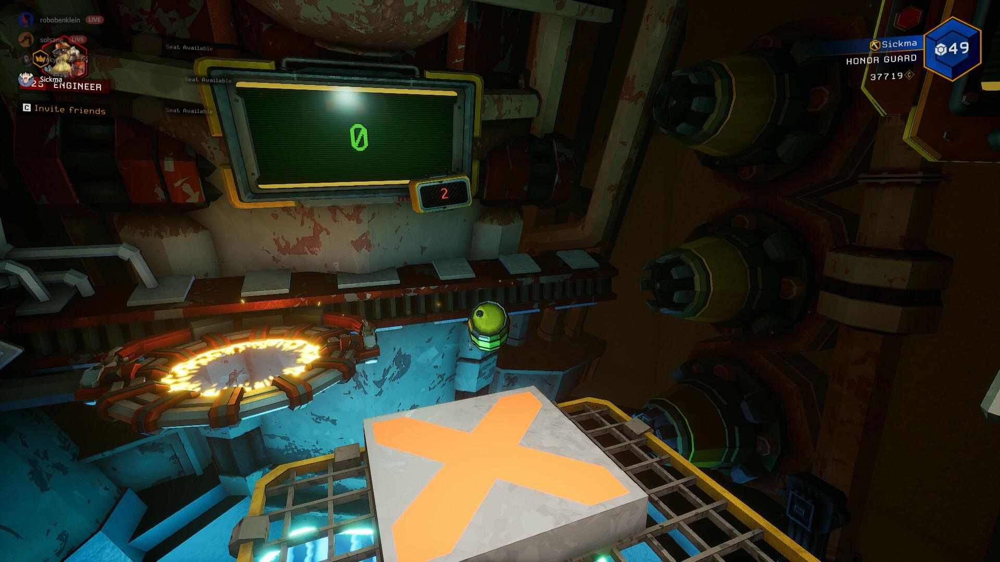

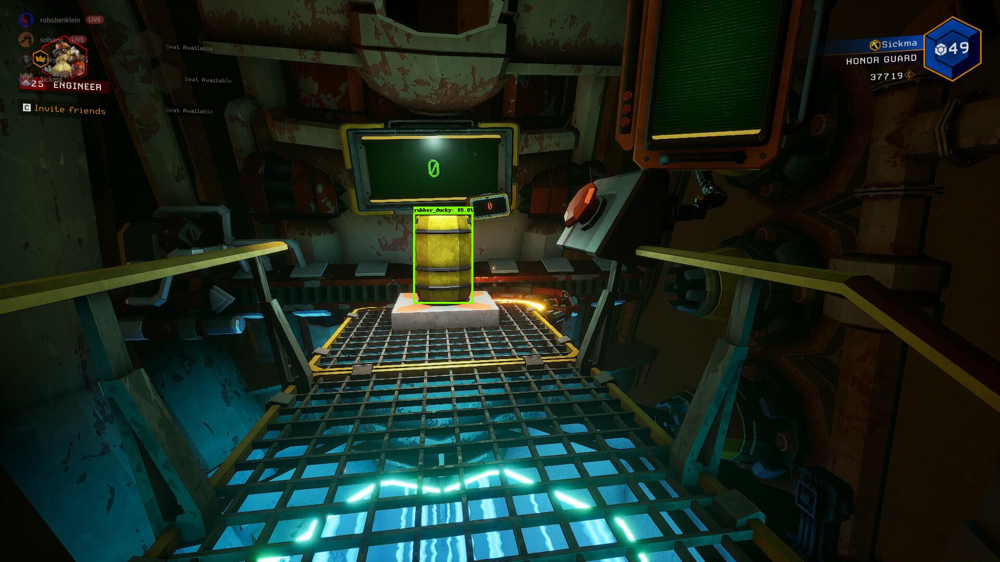

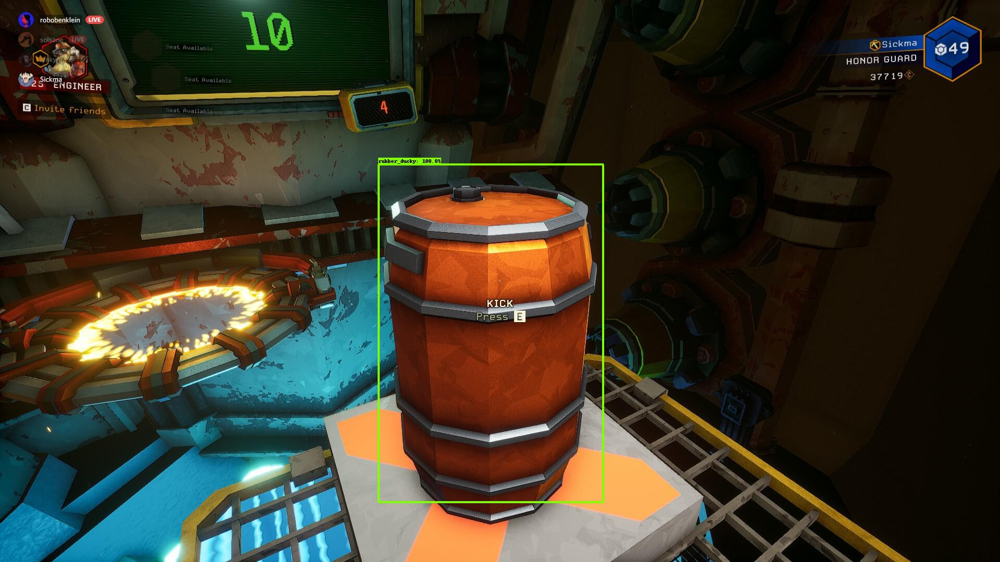

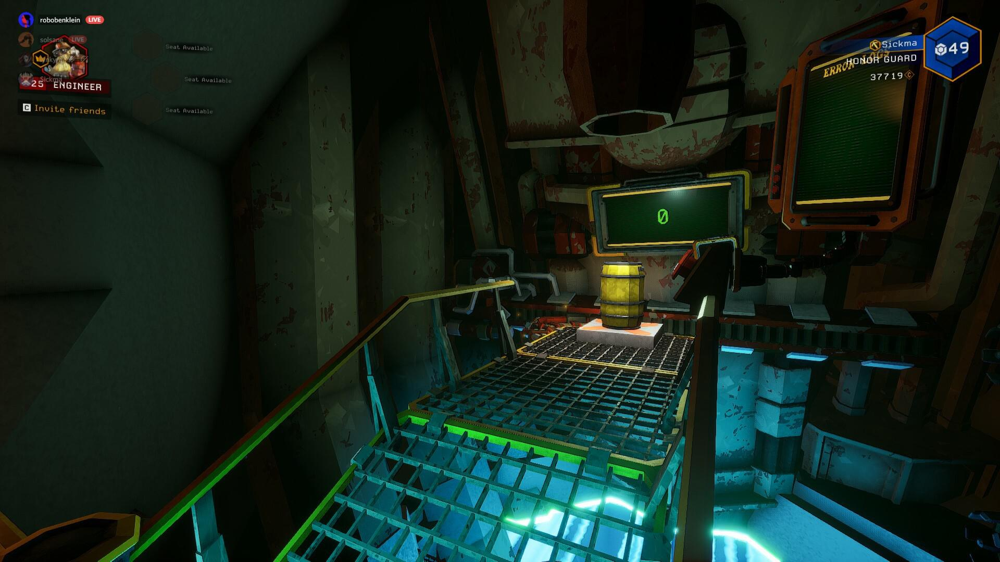

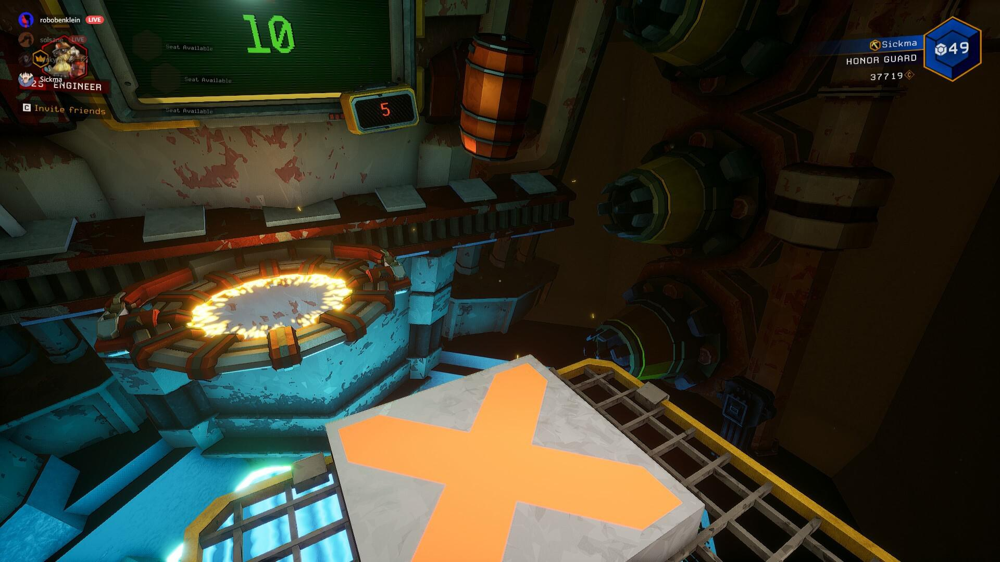

...

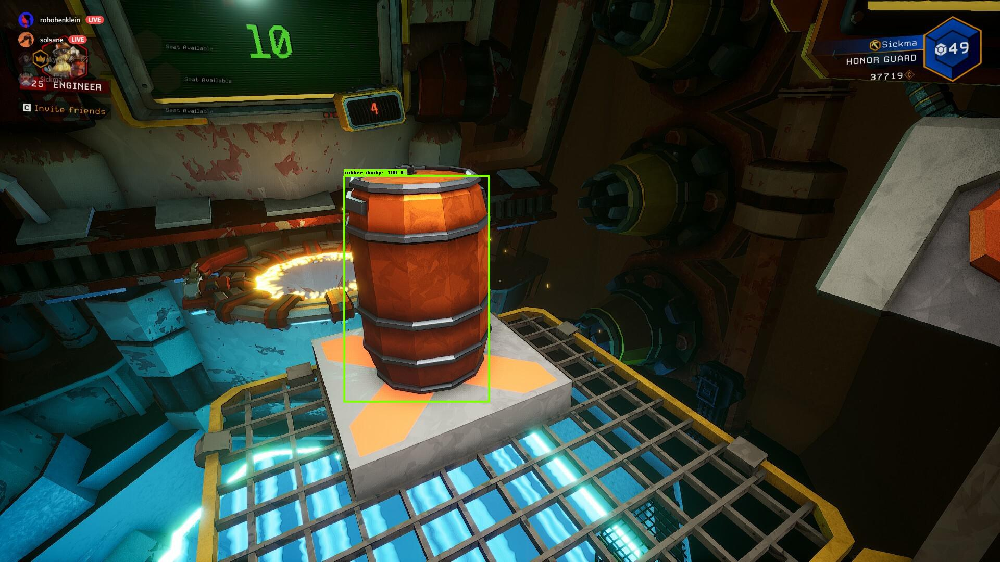

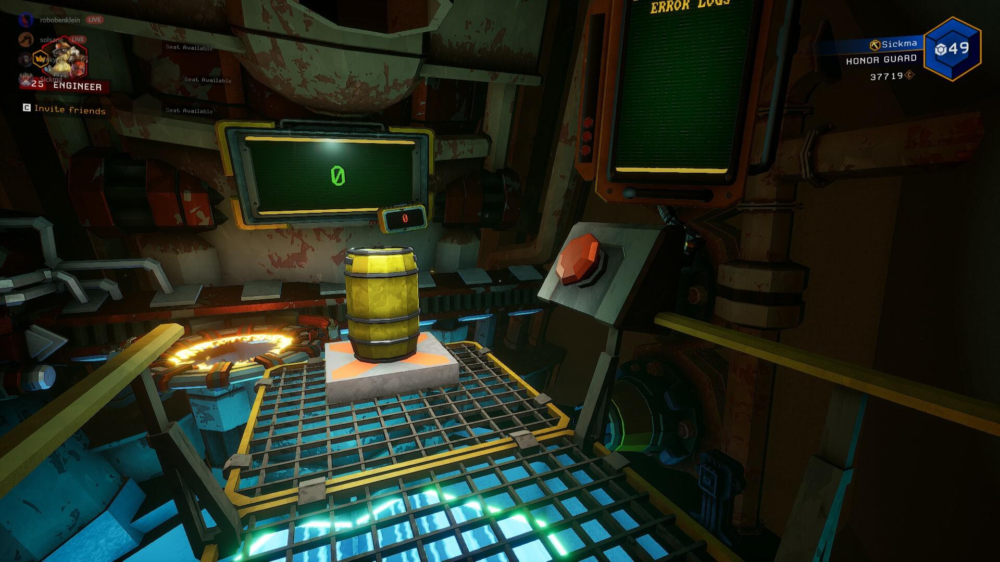

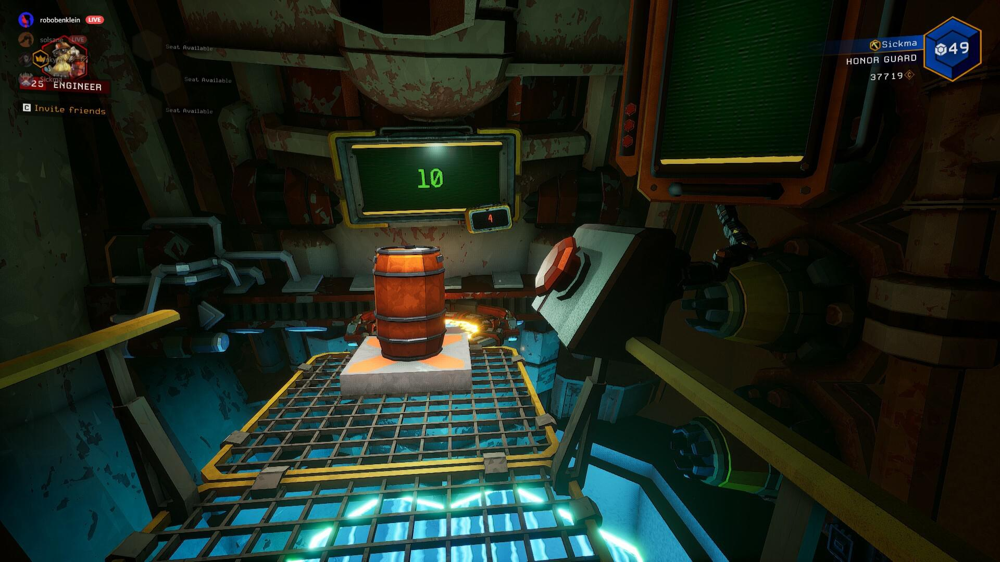

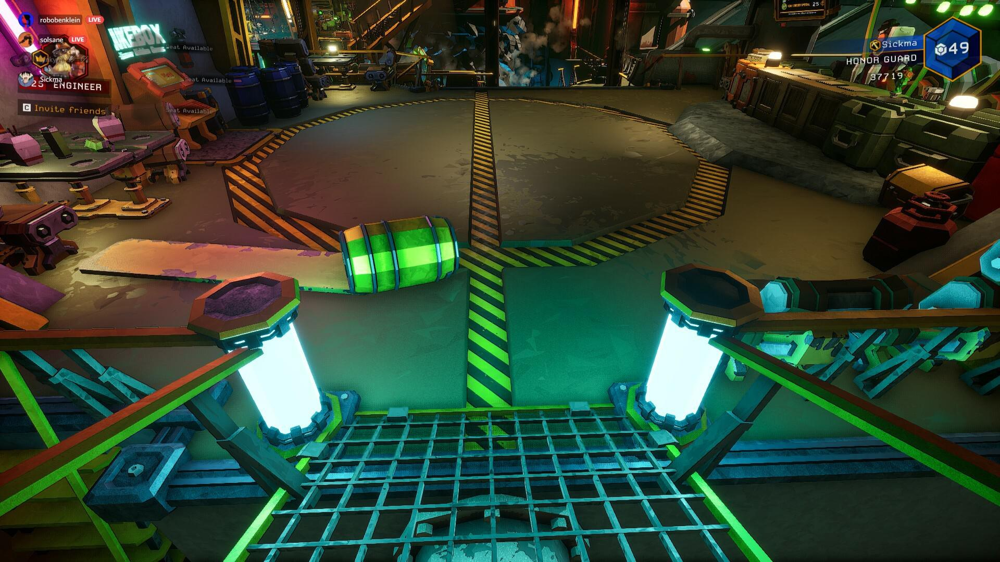

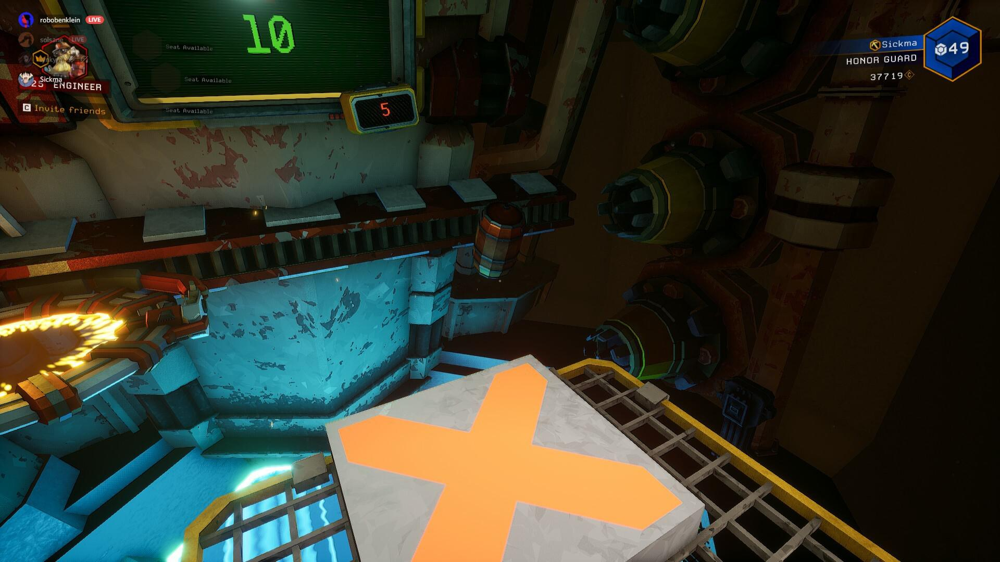

In [ ]:
imageio.plugins.freeimage.download()

anim_file = 'duckies_test.gif'

filenames = glob.glob('gif_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []
for filename in filenames:
  image = imageio.imread(filename)
  images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=5)

display(IPyImage(open(anim_file, 'rb').read()))

In [ ]:
!ls -lah

total 286M
drwxr-xr-x 1 root   root  4.0K Aug  6 06:22 .
drwxr-xr-x 1 root   root  4.0K Aug  6 04:59 ..
drwxr-xr-x 1 root   root  4.0K Aug  3 16:17 .config
drwxr-xr-x 6 root   root  4.0K Aug  6 06:17 DeepDeepBarrelKicker
-rw-r--r-- 1 root   root   41M Aug  6 06:22 duckies_test.gif
-rw-r--r-- 1 root   root  196K Aug  6 06:19 gif_frame_00.jpg
-rw-r--r-- 1 root   root  218K Aug  6 06:19 gif_frame_01.jpg
-rw-r--r-- 1 root   root  213K Aug  6 06:19 gif_frame_02.jpg
-rw-r--r-- 1 root   root  199K Aug  6 06:19 gif_frame_03.jpg
-rw-r--r-- 1 root   root  192K Aug  6 06:19 gif_frame_04.jpg
-rw-r--r-- 1 root   root  197K Aug  6 06:19 gif_frame_05.jpg
-rw-r--r-- 1 root   root  217K Aug  6 06:19 gif_frame_06.jpg
-rw-r--r-- 1 root   root  255K Aug  6 06:19 gif_frame_07.jpg
-rw-r--r-- 1 root   root  187K Aug  6 06:19 gif_frame_08.jpg
-rw-r--r-- 1 root   root  218K Aug  6 06:19 gif_frame_09.jpg
-rw-r--r-- 1 root   root  211K Aug  6 06:19 gif_frame_10.jpg
-rw-r--r-- 1 root   root  193K Aug  6 06:19 gif